# <span style='font-weight:bold'>Drowsy Driver Detection</span>


### Generic CNN

### Creating the data sets

Run this cell **just once** to create train/val/test folders. Note that I already had existing 'test' and 'train' folders, each of which contained a 'Drowsy' and 'Non Drowsy' folder.

### Preparing the images

In [4]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define paths to your data
train_data_path = '/Users/alexkim/Documents/MSBA/Fall 2023/Advanced ML/Project/train'
validation_data_path = '/Users/alexkim/Documents/MSBA/Fall 2023/Advanced ML/Project/validation'
test_data_path = '/Users/alexkim/Documents/MSBA/Fall 2023/Advanced ML/Project/test'

# Define image dimensions and batch size
img_height, img_width = 224, 224
batch_size = 32


In [5]:
# Create data generators with augmentation for training set
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

train_generator = train_datagen.flow_from_directory(
    train_data_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'  # 'binary' because you have two classes: drowsy and non_drowsy
)

# Create data generator for validation set
validation_datagen = ImageDataGenerator(rescale=1./255)

validation_generator = validation_datagen.flow_from_directory(
    validation_data_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

Found 5836 images belonging to 2 classes.
Found 1460 images belonging to 2 classes.


### Building the model(s)

### Simple CNN with few layers/neurons and faster learning rate

This model is quite dumb. It performs no better than baseline accuracy.

In [3]:
# Build a simple CNN model with a final sigmoid activation for binary classification
model = keras.Sequential([
    layers.Conv2D(16, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(32, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(32, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])


# Compile the model
model.compile(
    optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.01), #increased learning rate
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Train the model
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator
)

Epoch 1/10
183/183 [==============================] - 179s 974ms/step - loss: 0.9997 - accuracy: 0.5264 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 2/10
183/183 [==============================] - 177s 967ms/step - loss: 0.6935 - accuracy: 0.4931 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 3/10
183/183 [==============================] - 178s 972ms/step - loss: 0.6935 - accuracy: 0.4973 - val_loss: 0.6934 - val_accuracy: 0.5000
Epoch 4/10
183/183 [==============================] - 177s 968ms/step - loss: 0.6934 - accuracy: 0.4997 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 5/10
183/183 [==============================] - 178s 974ms/step - loss: 0.6933 - accuracy: 0.5045 - val_loss: 0.6935 - val_accuracy: 0.5000
Epoch 6/10
183/183 [==============================] - 177s 968ms/step - loss: 0.6935 - accuracy: 0.5034 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 7/10
183/183 [==============================] - 176s 963ms/step - loss: 0.6934 - accuracy: 0.4931 - val_loss: 0.6932 -

In [29]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 16)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 32)        0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 93312)             0         
                                                                 
 dense (Dense)               (None, 32)                2

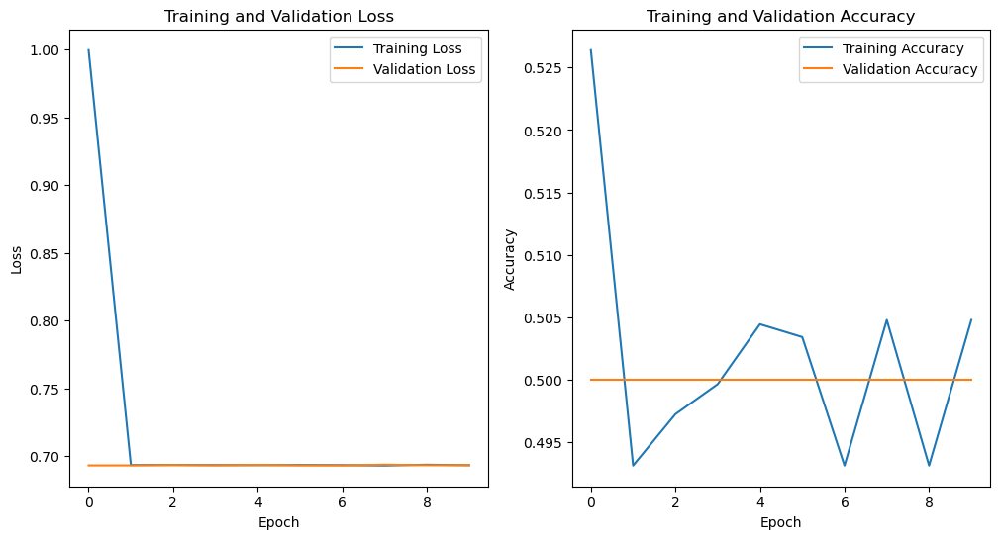

In [4]:
import matplotlib.pyplot as plt

# Plot training and validation loss
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.show()

#### Testing the model

In [5]:
# Evaluate the model on the test set
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_data_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy}")


Found 1824 images belonging to 2 classes.
57/57 [==============================] - 32s 554ms/step - loss: 0.6934 - accuracy: 0.5000
Test Accuracy: 0.5


### Same number of layers/neurons but slower learning rate

Still no better than baseline.

In [6]:
# Build a simple CNN model with a final sigmoid activation for binary classification
model1 = keras.Sequential([
    layers.Conv2D(16, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(32, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(32, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

# Compile the model
model1.compile(
    optimizer='adam', # defaut learning rate of 0.001
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Train the model
history1 = model1.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator
)

Epoch 1/10
183/183 [==============================] - 178s 973ms/step - loss: 0.7293 - accuracy: 0.5027 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 2/10
183/183 [==============================] - 177s 969ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 3/10
183/183 [==============================] - 176s 959ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 4/10
183/183 [==============================] - 180s 985ms/step - loss: 0.6932 - accuracy: 0.4966 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 5/10
183/183 [==============================] - 178s 971ms/step - loss: 0.6932 - accuracy: 0.4931 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 6/10
183/183 [==============================] - 178s 970ms/step - loss: 0.6932 - accuracy: 0.4990 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 7/10
183/183 [==============================] - 178s 971ms/step - loss: 0.6932 - accuracy: 0.4955 - val_loss: 0.6931 -

In [30]:
model1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 222, 222, 16)      448       
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 111, 111, 16)      0         
 g2D)                                                            
                                                                 
 conv2d_3 (Conv2D)           (None, 109, 109, 32)      4640      
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 54, 54, 32)        0         
 g2D)                                                            
                                                                 
 flatten_1 (Flatten)         (None, 93312)             0         
                                                                 
 dense_2 (Dense)             (None, 32)               

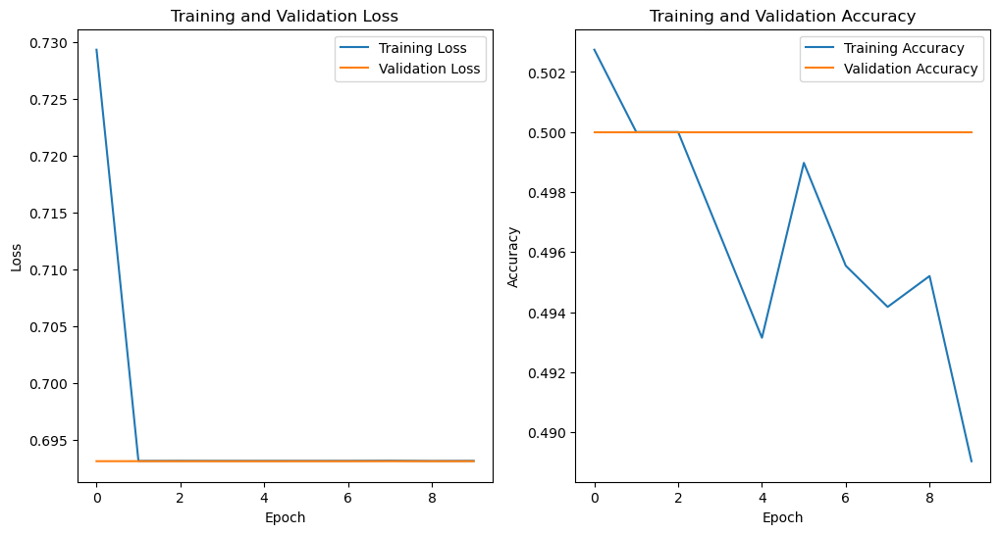

In [7]:
import matplotlib.pyplot as plt

# Plot training and validation loss
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history1.history['loss'], label='Training Loss')
plt.plot(history1.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history1.history['accuracy'], label='Training Accuracy')
plt.plot(history1.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.show()

#### Testing the model

In [8]:
# Evaluate the model on the test set
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_data_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

test_loss, test_accuracy = model1.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy}")


Found 1824 images belonging to 2 classes.
57/57 [==============================] - 31s 538ms/step - loss: 0.6931 - accuracy: 0.5000
Test Accuracy: 0.5


### More complex network (more layers/neurons) with faster learning rate

Still dumb.

In [10]:
# Build a simple CNN model with a final sigmoid activation for binary classification
model2 = keras.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(1, activation='sigmoid')  # Binary classification (drowsy or non_drowsy)
])

# Compile the model
model2.compile(
    optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.01), #increased learning rate
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Train the model
history2 = model2.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator
)

Epoch 1/10
183/183 [==============================] - 313s 2s/step - loss: 3.2506 - accuracy: 0.5024 - val_loss: 0.6935 - val_accuracy: 0.5000
Epoch 2/10
183/183 [==============================] - 262s 1s/step - loss: 0.6936 - accuracy: 0.4942 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 3/10
183/183 [==============================] - 260s 1s/step - loss: 0.6933 - accuracy: 0.5051 - val_loss: 0.6933 - val_accuracy: 0.5000
Epoch 4/10
183/183 [==============================] - 267s 1s/step - loss: 0.6934 - accuracy: 0.5007 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 5/10
183/183 [==============================] - 268s 1s/step - loss: 0.6933 - accuracy: 0.5041 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 6/10
183/183 [==============================] - 268s 1s/step - loss: 0.6934 - accuracy: 0.5014 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 7/10
183/183 [==============================] - 271s 1s/step - loss: 0.6936 - accuracy: 0.4945 - val_loss: 0.6932 - val_accuracy: 0.5000

In [31]:
model2.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 111, 111, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_9 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 26, 26, 128)      

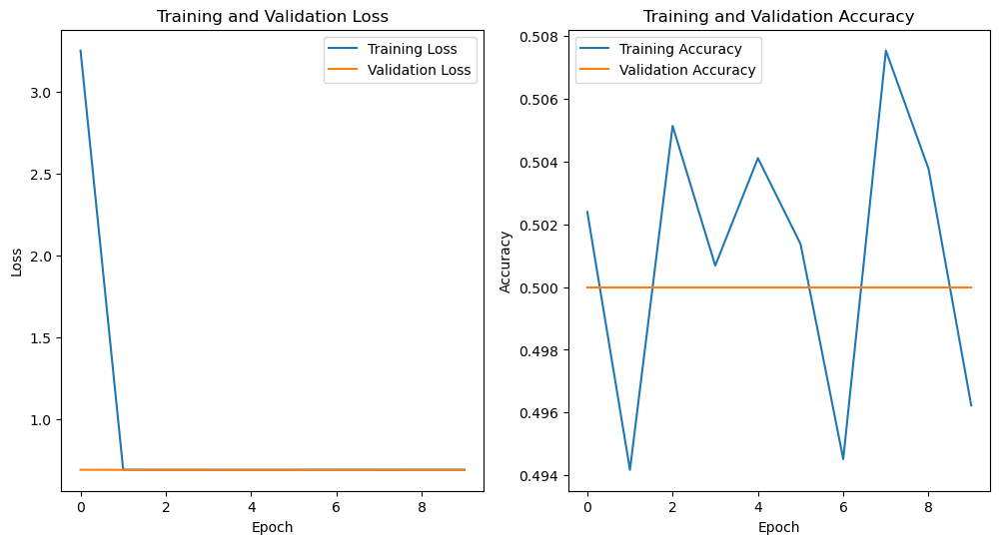

In [11]:
import matplotlib.pyplot as plt

# Plot training and validation loss
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history2.history['loss'], label='Training Loss')
plt.plot(history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history2.history['accuracy'], label='Training Accuracy')
plt.plot(history2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.show()

In [12]:
# Evaluate the model on the test set
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_data_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

test_loss, test_accuracy = model2.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy}")


Found 1824 images belonging to 2 classes.
57/57 [==============================] - 38s 668ms/step - loss: 0.6933 - accuracy: 0.5000
Test Accuracy: 0.5


### More complex CNN with slower learning rate

Finally get accuracy above baseline.

In [13]:
# Build a simple CNN model with a final sigmoid activation for binary classification
model3 = keras.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(1, activation='sigmoid')  # Binary classification (drowsy or non_drowsy)
])


# Compile the model
model3.compile(
    optimizer='adam', # defaut learning rate of 0.001
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Train the model
history3 = model3.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator
)

Epoch 1/10
183/183 [==============================] - 307s 2s/step - loss: 0.5334 - accuracy: 0.7306 - val_loss: 0.4193 - val_accuracy: 0.8014
Epoch 2/10
183/183 [==============================] - 305s 2s/step - loss: 0.4141 - accuracy: 0.7916 - val_loss: 0.3679 - val_accuracy: 0.8068
Epoch 3/10
183/183 [==============================] - 313s 2s/step - loss: 0.3716 - accuracy: 0.8180 - val_loss: 0.3563 - val_accuracy: 0.8260
Epoch 4/10
183/183 [==============================] - 304s 2s/step - loss: 0.3528 - accuracy: 0.8297 - val_loss: 0.3324 - val_accuracy: 0.8390
Epoch 5/10
183/183 [==============================] - 308s 2s/step - loss: 0.3502 - accuracy: 0.8388 - val_loss: 0.3516 - val_accuracy: 0.8158
Epoch 6/10
183/183 [==============================] - 305s 2s/step - loss: 0.3470 - accuracy: 0.8372 - val_loss: 0.3525 - val_accuracy: 0.8260
Epoch 7/10
183/183 [==============================] - 306s 2s/step - loss: 0.3354 - accuracy: 0.8413 - val_loss: 0.3546 - val_accuracy: 0.8363

In [32]:
model3.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 111, 111, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_11 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_11 (MaxPooli  (None, 54, 54, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_12 (Conv2D)          (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_12 (MaxPooli  (None, 26, 26, 128)      

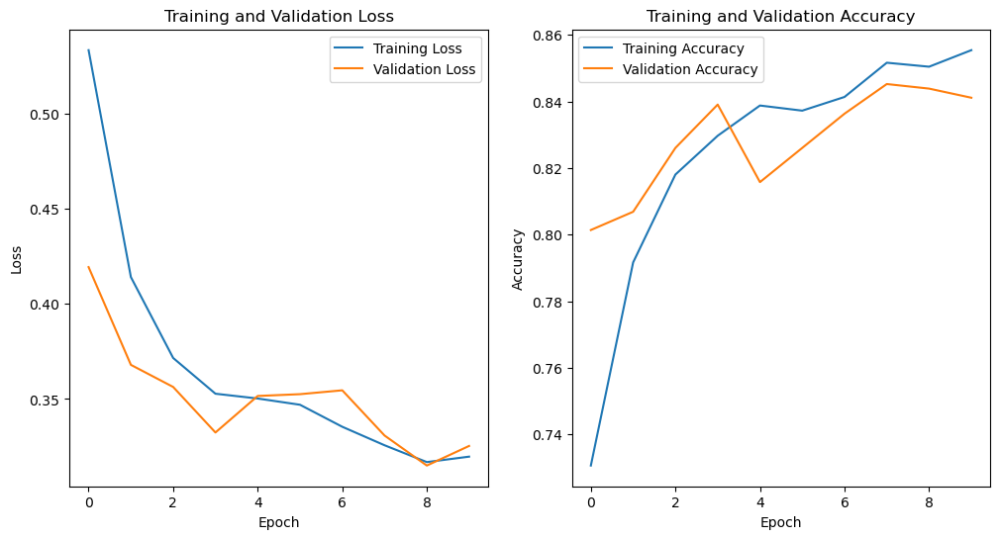

In [14]:
import matplotlib.pyplot as plt

# Plot training and validation loss
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history3.history['loss'], label='Training Loss')
plt.plot(history3.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history3.history['accuracy'], label='Training Accuracy')
plt.plot(history3.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.show()

#### Testing the model

In [15]:
# Evaluate the model on the test set
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_data_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

test_loss, test_accuracy = model3.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy}")


Found 1824 images belonging to 2 classes.
57/57 [==============================] - 39s 679ms/step - loss: 0.3444 - accuracy: 0.8443
Test Accuracy: 0.844298243522644


### Even more layers / neurons

In [16]:
model4 = keras.Sequential([
    layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(256, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(512, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Flatten(),
    
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.5),  # Adding dropout for regularization
    
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    
    layers.Dense(1, activation='sigmoid')
])

# Compile the model
model4.compile(
    optimizer='adam', # defaut learning rate of 0.001
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Train the model
history4 = model4.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator
)

Epoch 1/10
183/183 [==============================] - 830s 5s/step - loss: 0.5737 - accuracy: 0.6984 - val_loss: 0.4684 - val_accuracy: 0.7733
Epoch 2/10
183/183 [==============================] - 809s 4s/step - loss: 0.4564 - accuracy: 0.7671 - val_loss: 0.4109 - val_accuracy: 0.7808
Epoch 3/10
183/183 [==============================] - 855s 5s/step - loss: 0.4298 - accuracy: 0.7831 - val_loss: 0.4106 - val_accuracy: 0.7753
Epoch 4/10
183/183 [==============================] - 881s 5s/step - loss: 0.4089 - accuracy: 0.7927 - val_loss: 0.3727 - val_accuracy: 0.8171
Epoch 5/10
183/183 [==============================] - 836s 5s/step - loss: 0.3908 - accuracy: 0.8095 - val_loss: 0.3593 - val_accuracy: 0.8233
Epoch 6/10
183/183 [==============================] - 817s 4s/step - loss: 0.3832 - accuracy: 0.8194 - val_loss: 0.3459 - val_accuracy: 0.8267
Epoch 7/10
183/183 [==============================] - 933s 5s/step - loss: 0.3702 - accuracy: 0.8206 - val_loss: 0.3423 - val_accuracy: 0.8336

In [33]:
model4.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_13 (Conv2D)          (None, 222, 222, 64)      1792      
                                                                 
 max_pooling2d_13 (MaxPooli  (None, 111, 111, 64)      0         
 ng2D)                                                           
                                                                 
 conv2d_14 (Conv2D)          (None, 109, 109, 128)     73856     
                                                                 
 max_pooling2d_14 (MaxPooli  (None, 54, 54, 128)       0         
 ng2D)                                                           
                                                                 
 conv2d_15 (Conv2D)          (None, 52, 52, 256)       295168    
                                                                 
 max_pooling2d_15 (MaxPooli  (None, 26, 26, 256)      

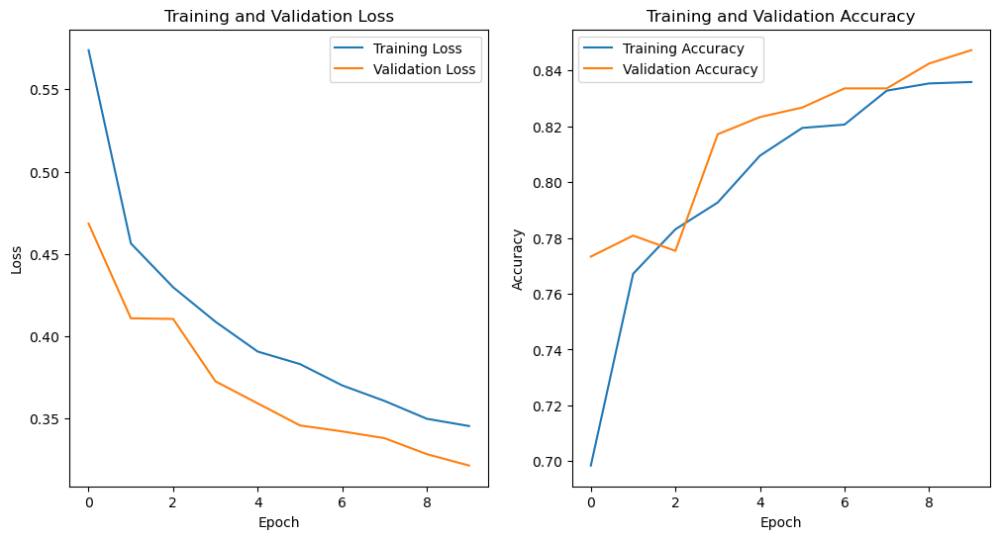

In [17]:
import matplotlib.pyplot as plt

# Plot training and validation loss
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history4.history['loss'], label='Training Loss')
plt.plot(history4.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history4.history['accuracy'], label='Training Accuracy')
plt.plot(history4.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.show()

In [18]:
# Evaluate the model on the test set
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_data_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

test_loss, test_accuracy = model4.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy}")


Found 1824 images belonging to 2 classes.
57/57 [==============================] - 76s 1s/step - loss: 0.3386 - accuracy: 0.8432
Test Accuracy: 0.843201756477356


### Even more epochs

Accuracy continues to improve. Validation accuracy doesn't appear to plateau/decrease yet.

In [23]:
model6 = keras.Sequential([
    layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(256, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(512, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Flatten(),
    
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.5),  # Adding dropout for regularization
    
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    
    layers.Dense(1, activation='sigmoid')
])

# Compile the model
model6.compile(
    optimizer='adam', # defaut learning rate of 0.001
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Train the model
history6 = model6.fit(
    train_generator,
    epochs=50,
    validation_data=validation_generator
)

Epoch 1/50
183/183 [==============================] - 801s 4s/step - loss: 0.5696 - accuracy: 0.6984 - val_loss: 0.4400 - val_accuracy: 0.7473
Epoch 2/50
183/183 [==============================] - 787s 4s/step - loss: 0.4585 - accuracy: 0.7623 - val_loss: 0.4312 - val_accuracy: 0.7712
Epoch 3/50
183/183 [==============================] - 852s 5s/step - loss: 0.4354 - accuracy: 0.7877 - val_loss: 0.3990 - val_accuracy: 0.8014
Epoch 4/50
183/183 [==============================] - 880s 5s/step - loss: 0.4171 - accuracy: 0.7968 - val_loss: 0.3737 - val_accuracy: 0.7993
Epoch 5/50
183/183 [==============================] - 870s 5s/step - loss: 0.3967 - accuracy: 0.8081 - val_loss: 0.3547 - val_accuracy: 0.8253
Epoch 6/50
183/183 [==============================] - 869s 5s/step - loss: 0.3818 - accuracy: 0.8182 - val_loss: 0.3491 - val_accuracy: 0.8336
Epoch 7/50
183/183 [==============================] - 872s 5s/step - loss: 0.3705 - accuracy: 0.8196 - val_loss: 0.3456 - val_accuracy: 0.8308

In [35]:
model6.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 222, 222, 64)      1792      
                                                                 
 max_pooling2d_21 (MaxPooli  (None, 111, 111, 64)      0         
 ng2D)                                                           
                                                                 
 conv2d_22 (Conv2D)          (None, 109, 109, 128)     73856     
                                                                 
 max_pooling2d_22 (MaxPooli  (None, 54, 54, 128)       0         
 ng2D)                                                           
                                                                 
 conv2d_23 (Conv2D)          (None, 52, 52, 256)       295168    
                                                                 
 max_pooling2d_23 (MaxPooli  (None, 26, 26, 256)      

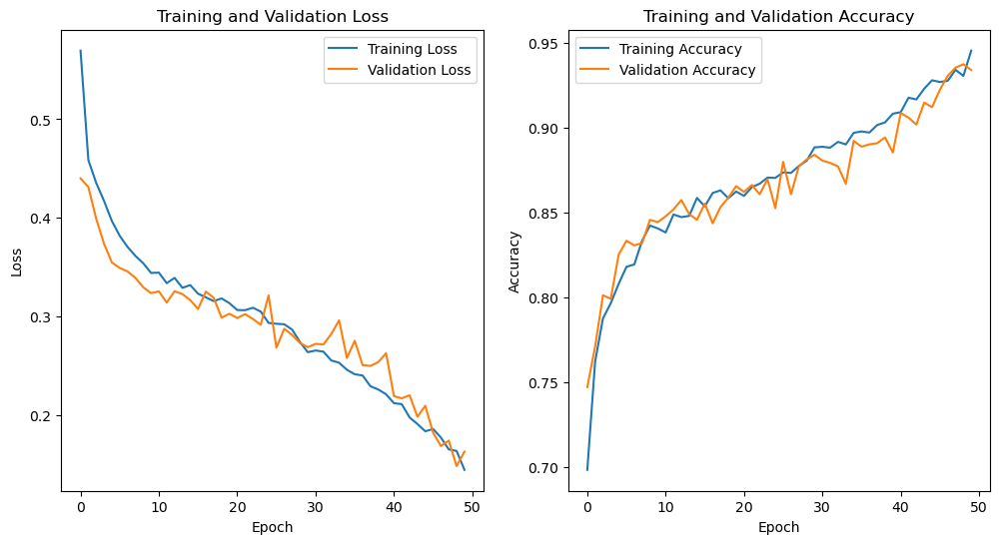

In [24]:
import matplotlib.pyplot as plt

# Plot training and validation loss
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history6.history['loss'], label='Training Loss')
plt.plot(history6.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history6.history['accuracy'], label='Training Accuracy')
plt.plot(history6.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.show()

In [25]:
# Evaluate the model on the test set
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_data_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

test_loss, test_accuracy = model6.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy}")


Found 1824 images belonging to 2 classes.
57/57 [==============================] - 75s 1s/step - loss: 0.1926 - accuracy: 0.9227
Test Accuracy: 0.9226973652839661


### Even MORE epochs :o

This takes >20hrs to rn

In [26]:
model7 = keras.Sequential([
    layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(256, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(512, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Flatten(),
    
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.5),  # Adding dropout for regularization
    
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    
    layers.Dense(1, activation='sigmoid')
])

# Compile the model
model7.compile(
    optimizer='adam', # defaut learning rate of 0.001
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Train the model
history7 = model7.fit(
    train_generator,
    epochs=100,
    validation_data=validation_generator
)

Epoch 1/100
183/183 [==============================] - 806s 4s/step - loss: 0.5927 - accuracy: 0.6809 - val_loss: 0.4794 - val_accuracy: 0.7514
Epoch 2/100
183/183 [==============================] - 809s 4s/step - loss: 0.4670 - accuracy: 0.7678 - val_loss: 0.4360 - val_accuracy: 0.7623
Epoch 3/100
183/183 [==============================] - 825s 5s/step - loss: 0.4372 - accuracy: 0.7803 - val_loss: 0.4235 - val_accuracy: 0.7863
Epoch 4/100
183/183 [==============================] - 825s 5s/step - loss: 0.4139 - accuracy: 0.7942 - val_loss: 0.3706 - val_accuracy: 0.8055
Epoch 5/100
183/183 [==============================] - 806s 4s/step - loss: 0.4004 - accuracy: 0.8014 - val_loss: 0.3713 - val_accuracy: 0.8137
Epoch 6/100
183/183 [==============================] - 801s 4s/step - loss: 0.3860 - accuracy: 0.8119 - val_loss: 0.3470 - val_accuracy: 0.8192
Epoch 7/100
183/183 [==============================] - 791s 4s/step - loss: 0.3778 - accuracy: 0.8141 - val_loss: 0.3542 - val_accuracy:

In [36]:
model7.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_25 (Conv2D)          (None, 222, 222, 64)      1792      
                                                                 
 max_pooling2d_25 (MaxPooli  (None, 111, 111, 64)      0         
 ng2D)                                                           
                                                                 
 conv2d_26 (Conv2D)          (None, 109, 109, 128)     73856     
                                                                 
 max_pooling2d_26 (MaxPooli  (None, 54, 54, 128)       0         
 ng2D)                                                           
                                                                 
 conv2d_27 (Conv2D)          (None, 52, 52, 256)       295168    
                                                                 
 max_pooling2d_27 (MaxPooli  (None, 26, 26, 256)      

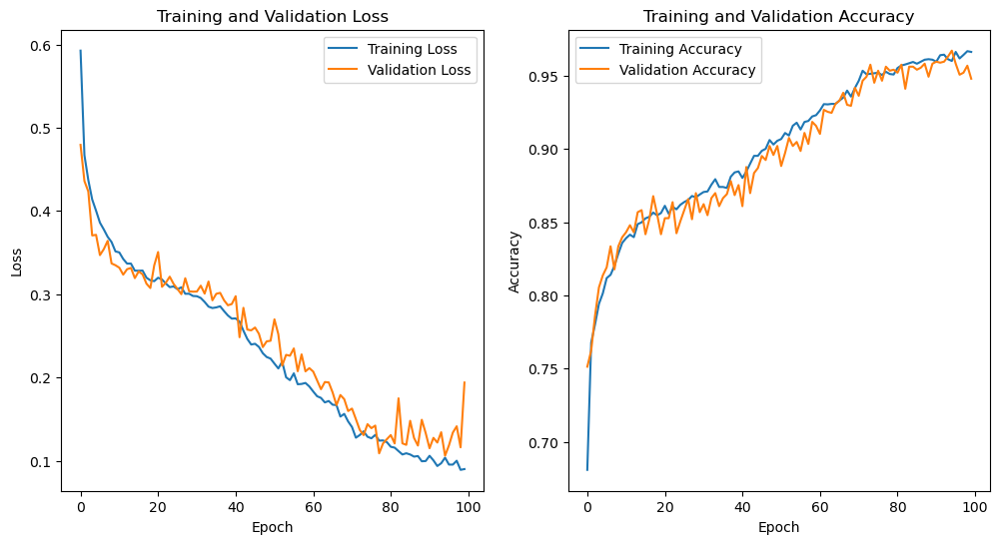

In [27]:
import matplotlib.pyplot as plt

# Plot training and validation loss
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history7.history['loss'], label='Training Loss')
plt.plot(history7.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history7.history['accuracy'], label='Training Accuracy')
plt.plot(history7.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.show()

In [28]:
# Evaluate the model on the test set
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_data_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

test_loss, test_accuracy = model7.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy}")


Found 1824 images belonging to 2 classes.
57/57 [==============================] - 80s 1s/step - loss: 0.2440 - accuracy: 0.9293
Test Accuracy: 0.9292762875556946


# Complex CNN2

## Creating the data sets

Run this cell **just once** to create train/val/test folders. Note that I already had existing 'test' and 'train' folders, each of which contained a 'Drowsy' and 'Non Drowsy' folder.

## Preparing the images

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define paths to your data
train_data_path = '/Users/alexkim/Documents/MSBA/Fall 2023/Advanced ML/Project/train'
validation_data_path = '/Users/alexkim/Documents/MSBA/Fall 2023/Advanced ML/Project/validation'
test_data_path = '/Users/alexkim/Documents/MSBA/Fall 2023/Advanced ML/Project/test'

# Define image dimensions and batch size
img_height, img_width = 224, 224
batch_size = 32


In [2]:
# Create data generators with augmentation for training set
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

train_generator = train_datagen.flow_from_directory(
    train_data_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'  # 'binary' because you have two classes: drowsy and non_drowsy
)

# Create data generator for validation set
validation_datagen = ImageDataGenerator(rescale=1./255)

validation_generator = validation_datagen.flow_from_directory(
    validation_data_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

Found 5836 images belonging to 2 classes.
Found 1460 images belonging to 2 classes.


## Building the model(s)

### Training for 100 epochs

This takes >20hrs to rn

In [7]:
pip install scipy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.7/29.7 MB 11.7 MB/s eta 0:00:0000:0100:01

[notice] A new release of pip available: 22.3.1 -> 23.3.1
[notice] To update, run: pip3 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [3]:
from scipy import misc


In [5]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

model7 = keras.Sequential([
    layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(256, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(512, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Flatten(),
    
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.5),  # Adding dropout for regularization
    
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    
    layers.Dense(1, activation='sigmoid')
])

# Compile the model
model7.compile(
    optimizer='adam',  # default learning rate of 0.001
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Define callbacks
checkpoint = ModelCheckpoint("model7.h5", monitor='val_accuracy', verbose=1, save_best_only=True, save_weights_only=False, mode='max')

early_stopping_callbacks = EarlyStopping(patience=15, restore_best_weights=True, verbose=1)

# Train the model with callbacks
history7 = model7.fit(
    train_generator,
    epochs=100,
    validation_data=validation_generator,
    callbacks=[checkpoint, early_stopping_callbacks]  # Include callbacks here
)


Epoch 1/100
183/183 [==============================] - ETA: 0s - loss: 0.5537 - accuracy: 0.7111
Epoch 1: val_accuracy improved from -inf to 0.75479, saving model to model7.h5
183/183 [==============================] - 1040s 6s/step - loss: 0.5537 - accuracy: 0.7111 - val_loss: 0.4726 - val_accuracy: 0.7548
Epoch 2/100
183/183 [==============================] - ETA: 0s - loss: 0.4489 - accuracy: 0.7706
Epoch 2: val_accuracy improved from 0.75479 to 0.78973, saving model to model7.h5
183/183 [==============================] - 918s 5s/step - loss: 0.4489 - accuracy: 0.7706 - val_loss: 0.4225 - val_accuracy: 0.7897
Epoch 3/100
183/183 [==============================] - ETA: 0s - loss: 0.4270 - accuracy: 0.7863
Epoch 3: val_accuracy did not improve from 0.78973
183/183 [==============================] - 1793s 10s/step - loss: 0.4270 - accuracy: 0.7863 - val_loss: 0.3882 - val_accuracy: 0.7842
Epoch 4/100
183/183 [==============================] - ETA: 0s - loss: 0.4024 - accuracy: 0.7990
E

In [6]:
model7.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 222, 222, 64)      1792      
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 111, 111, 64)      0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 109, 109, 128)     73856     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 54, 54, 128)       0         
 g2D)                                                            
                                                                 
 conv2d_6 (Conv2D)           (None, 52, 52, 256)       295168    
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 26, 26, 256)      

In [7]:
from tensorflow.keras.models import load_model

model7.save('model7.h5')

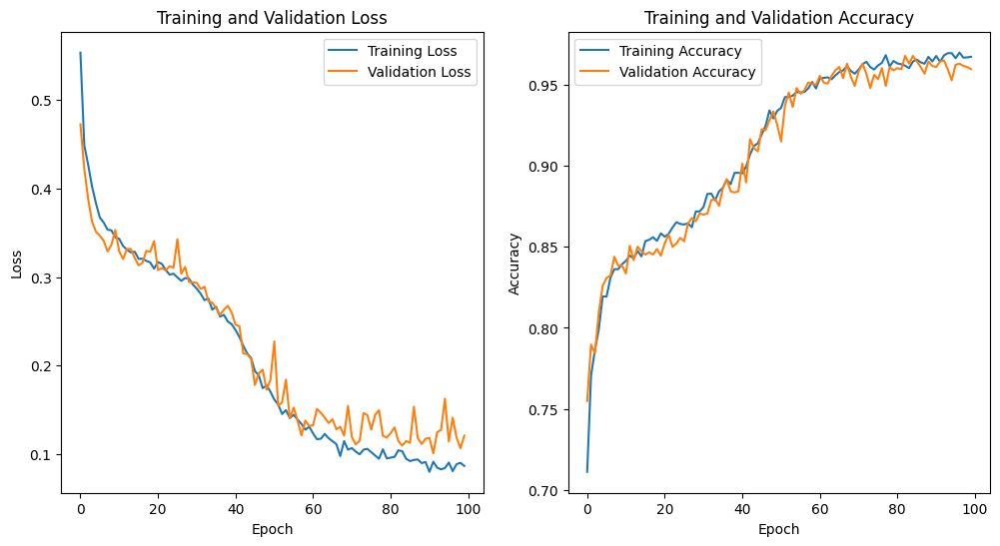

In [8]:
import matplotlib.pyplot as plt

# Plot training and validation loss
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history7.history['loss'], label='Training Loss')
plt.plot(history7.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history7.history['accuracy'], label='Training Accuracy')
plt.plot(history7.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.show()

In [9]:
# Evaluate the model on the test set
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_data_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

test_loss, test_accuracy = model7.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy}")


Found 1824 images belonging to 2 classes.
57/57 [==============================] - 81s 1s/step - loss: 0.1518 - accuracy: 0.9534
Test Accuracy: 0.953399121761322


## Visualizing final CNN

In [5]:
from tensorflow.keras.models import load_model

loaded_model = load_model('model7.h5')


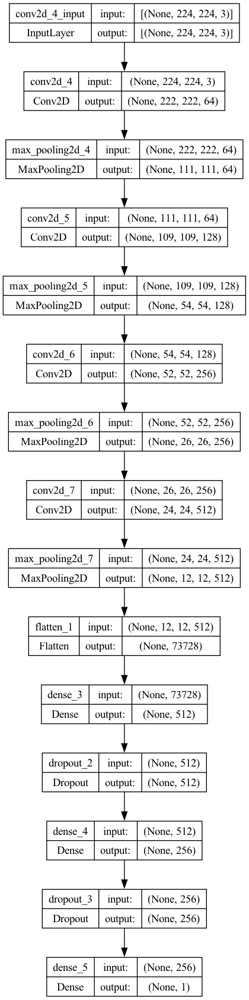

In [6]:
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import plot_model

# Plot the model summary and save it to a file (e.g., 'model_plot.png')
plot_model(loaded_model, to_file='//Users/alexkim/Documents/MSBA/Fall 2023/Advanced ML/Project/model_plot.png', show_shapes=True, show_layer_names=True)

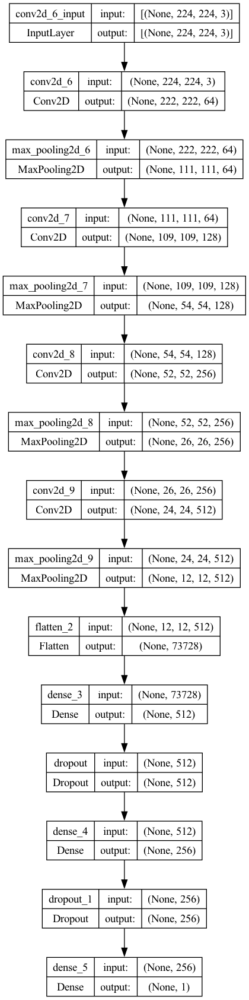

In [15]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.utils import plot_model

# Replace this with your actual CNN model architecture
model = Sequential([
    Conv2D(64, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D((2, 2)),
    
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    
    Conv2D(256, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    
    Conv2D(512, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    
    Flatten(),
    
    Dense(512, activation='relu'),
    Dropout(0.5),  # Adding dropout for regularization
    
    Dense(256, activation='relu'),
    Dropout(0.5),
    
    Dense(1, activation='sigmoid')
])

# Plot the model
plot_model(model, to_file='cnn_model.png', show_shapes=True)

In [1]:
# Load the libraries
import torch
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
import torch.optim as optim
import tqdm
from keras.models import Sequential, Model
from keras.layers import Dense, Conv2D, MaxPool2D, Flatten
from tensorflow.keras.applications.vgg16 import VGG16
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping
import tensorflow as tf
import shutil
from sklearn.metrics import confusion_matrix
import seaborn as sns
import cv2, os, random



In [12]:
#Final liraries 
import torch
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
import torch.optim as optim
import tqdm
import tensorflow as tf
from keras.models import Sequential, Model
from keras.layers import Dense, Conv2D, MaxPool2D, Flatten
from tensorflow.keras.applications.vgg16 import VGG16
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping

In [13]:
#load the data
data_dir = './driver_drowsy_v2'

train_dir = './driver_drowsy_v2/train'
val_dir = './driver_drowsy_v2/validation'
test_dir = './driver_drowsy_v2/test'

# VGG 16 Model

In [14]:
#Do image processing for the training, validation and test data

trdata = ImageDataGenerator(rescale=1./255)
traindata = trdata.flow_from_directory(directory=train_dir, target_size=(224,224))

vdata = ImageDataGenerator(rescale=1./255)
valdata = vdata.flow_from_directory(directory=val_dir, target_size=(224,224))

tsdata = ImageDataGenerator(rescale=1./255)
testdata = tsdata.flow_from_directory(directory=test_dir, target_size=(224,224))


Found 5836 images belonging to 2 classes.
Found 1460 images belonging to 2 classes.
Found 1824 images belonging to 2 classes.


In [15]:
#Set the VGG model and the layers to be trained
vggmodel = VGG16(weights='imagenet', include_top=True)
for layer in vggmodel.layers[:-4]:
    layer.trainable = False

for layers in (vggmodel.layers)[:19]:
    layers.trainable = False

In [16]:
#Show the summary of our model
vggmodel.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [18]:
#Create a final model from the VGG output using the final layer with a softmax output
X = vggmodel.layers[-2].output
predictions = Dense(2, activation="softmax")(X)
model_final = Model(inputs = vggmodel.input, outputs = predictions)

In [19]:
#Specify the loss function, optimizer and evaluation metric
model_final.compile(loss="binary_crossentropy", optimizer=Adam(learning_rate=0.001), metrics=["accuracy"])

In [20]:
#Final model to be trained
model_final.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [21]:
#Configure GPUs if available
config = tf.compat.v1.ConfigProto(gpu_options=tf.compat.v1.GPUOptions(allow_growth=True))
session = tf.compat.v1.Session(config=config)
tf.compat.v1.keras.backend.set_session(session)

In [22]:
# Define callbacks
checkpoint = ModelCheckpoint("vgg16_2.h5", monitor='val_accuracy', verbose=1, save_best_only=True, save_weights_only=False, mode='auto')
early = EarlyStopping(monitor='val_accuracy', min_delta=0, patience=40, verbose=1, mode='auto')

# fit the model
hist = model_final.fit(traindata, steps_per_epoch= 70, epochs= 30, validation_data= valdata, validation_steps=10, batch_size=64, callbacks=[checkpoint,early])


# Save the model weights
model_final.save_weights("vgg16_2.h5")


Epoch 1/30
70/70 [==============================] - ETA: 0s - loss: 1.3971 - accuracy: 0.7225
Epoch 1: val_accuracy improved from -inf to 0.79375, saving model to vgg16_2.h5
70/70 [==============================] - 522s 7s/step - loss: 1.3971 - accuracy: 0.7225 - val_loss: 0.3551 - val_accuracy: 0.7937
Epoch 2/30
70/70 [==============================] - ETA: 0s - loss: 0.3944 - accuracy: 0.8241
Epoch 2: val_accuracy improved from 0.79375 to 0.86875, saving model to vgg16_2.h5
70/70 [==============================] - 553s 8s/step - loss: 0.3944 - accuracy: 0.8241 - val_loss: 0.2781 - val_accuracy: 0.8687
Epoch 3/30
70/70 [==============================] - ETA: 0s - loss: 0.3288 - accuracy: 0.8536
Epoch 3: val_accuracy improved from 0.86875 to 0.87187, saving model to vgg16_2.h5
70/70 [==============================] - 560s 8s/step - loss: 0.3288 - accuracy: 0.8536 - val_loss: 0.3404 - val_accuracy: 0.8719
Epoch 4/30
70/70 [==============================] - ETA: 0s - loss: 0.2956 - accur

Epoch 30/30
70/70 [==============================] - ETA: 0s - loss: 0.1383 - accuracy: 0.9450
Epoch 30: val_accuracy did not improve from 0.95312
70/70 [==============================] - 554s 8s/step - loss: 0.1383 - accuracy: 0.9450 - val_loss: 0.3057 - val_accuracy: 0.8875


In [28]:
model_final.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

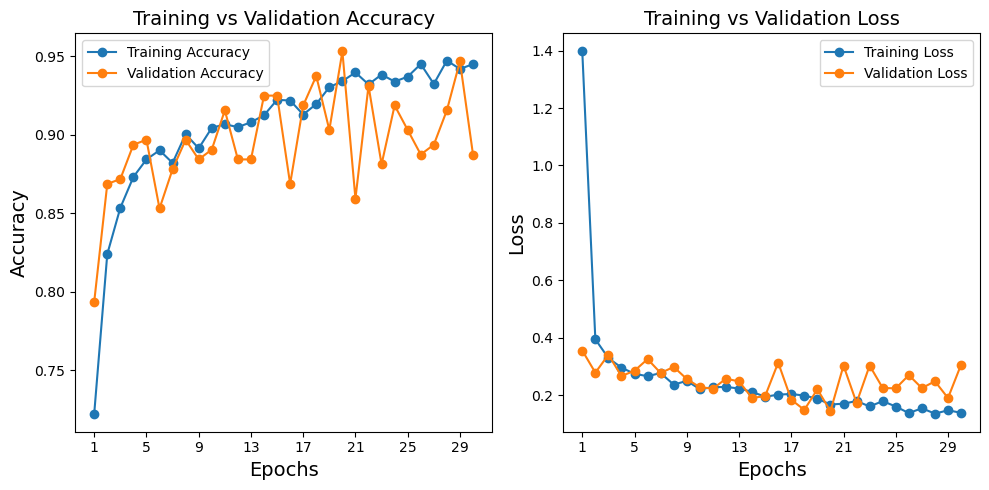

In [24]:
# Create subplots for accuracy and loss
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot training and validation accuracy values
ax[0].plot(range(1, len(hist.history['accuracy']) + 1), hist.history['accuracy'], linestyle='solid', marker='o', label='Training Accuracy')
ax[0].plot(range(1, len(hist.history['val_accuracy']) + 1), hist.history['val_accuracy'], linestyle='solid', marker='o', label='Validation Accuracy')
ax[0].set_xlabel('Epochs', fontsize=14)
ax[0].set_ylabel('Accuracy', fontsize=14)
ax[0].set_title('Training vs Validation Accuracy', fontsize=14)
ax[0].legend(loc='best')

# Set x-axis ticks for accuracy plot
ax[0].set_xticks(range(1, len(hist.history['accuracy'])+1,4))

# Plot training and validation loss values
ax[1].plot(range(1, len(hist.history['loss']) + 1), hist.history['loss'], linestyle='solid', marker='o', label='Training Loss')
ax[1].plot(range(1, len(hist.history['val_loss']) + 1), hist.history['val_loss'], linestyle='solid', marker='o', label='Validation Loss')
ax[1].set_xlabel('Epochs', fontsize=14)
ax[1].set_ylabel('Loss', fontsize=14)
ax[1].set_title('Training vs Validation Loss', fontsize=14)
ax[1].legend(loc='best')

# Set x-axis ticks for loss plot
ax[1].set_xticks(range(1, len(hist.history['loss'])+1,4))

# Adjust layout to prevent clipping of titles
plt.tight_layout()
plt.show()



In [25]:
# Load the saved weights
model_final.load_weights("vgg16_2.h5")

# Make predictions on the test set
predictions = model_final.predict(testdata)


57/57 [==============================] - 335s 6s/step


In [26]:
test_loss, test_accuracy = model_final.evaluate(testdata)
print(f"The testing accuracy is: {test_accuracy * 100:.2f}%")
print(f"The testing loss is: {test_loss * 100:.2}%")

57/57 [==============================] - 326s 6s/step - loss: 0.2753 - accuracy: 0.8986
The testing accuracy is: 89.86%
The testing loss is: 2.8e+01%


In [1]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.vgg19 import VGG19, preprocess_input
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dropout


# Parent directory path
parent_dir = "/s/chopin/l/grad/ukoul/CSU-CS545/Anubhav/0 FaceImages"

# Parameters
image_size = 224
batch_size = 64


def custom_generator(directory, batch_size, subset):
    datagen = ImageDataGenerator(
        preprocessing_function=preprocess_input, validation_split=0.2
    )
    generator = datagen.flow_from_directory(
        directory,
        target_size=(image_size, image_size),
        class_mode="binary",
        batch_size=batch_size,
        shuffle=True,
        subset=subset,
    )

    while True:
        batch_x, batch_y = next(generator)
        batch_faces = []
        for i in range(batch_x.shape[0]):
            face = detect_and_crop_face(batch_x[i])
            if face is not None:
                face = cv2.resize(face, (image_size, image_size))
                face = np.expand_dims(face, axis=0)
                batch_faces.append(face)
            else:
                resized = cv2.resize(batch_x[i], (image_size, image_size))
                resized = np.expand_dims(resized, axis=0)
                batch_faces.append(resized)

        if len(batch_faces) > 0:
            yield np.vstack(batch_faces), batch_y
        else:
            continue


# Load and configure the InceptionV3 model
base_model = VGG19(weights="imagenet", include_top=False)
for layer in base_model.layers:
    layer.trainable = False

# Add custom top layers to the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation="relu")(x)
x = Dropout(0.5)(x)

predictions = Dense(1, activation="sigmoid")(x)
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss="binary_crossentropy",
    metrics=["accuracy"],
)

# Prepare Training and Validation Data Generators
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input, validation_split=0.2
)
validation_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input, validation_split=0.2
)

train_generator = train_datagen.flow_from_directory(
    parent_dir,
    target_size=(image_size, image_size),
    class_mode="binary",
    batch_size=batch_size,
    shuffle=True,
    subset="training",
)

validation_generator = validation_datagen.flow_from_directory(
    parent_dir,
    target_size=(image_size, image_size),
    class_mode="binary",
    batch_size=batch_size,
    shuffle=True,
    subset="validation",
)

steps_per_epoch = train_generator.samples // batch_size
validation_steps = validation_generator.samples // batch_size

checkpoint = ModelCheckpoint(
    "vgg19_an_w_aug.h5",
    monitor="val_accuracy",
    verbose=1,
    save_best_only=True,
    save_weights_only=False,
    mode="max",
)


early_stopping_callbacks = tf.keras.callbacks.EarlyStopping(
    patience=15, restore_best_weights=True, verbose=1
)

# Fit the model on the data
history = model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=30,
    validation_data=validation_generator,
    validation_steps=validation_steps,
    callbacks=[checkpoint, early_stopping_callbacks],
)

# Save the trained model
model.save('vgf19_an_w_aug.h5')

2023-11-27 00:59:47.646473: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-11-27 00:59:47.647610: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-11-27 00:59:47.670488: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-11-27 00:59:47.670940: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-11-27 00:59:49.083751: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not fin

Found 7296 images belonging to 2 classes.
Found 1824 images belonging to 2 classes.
Epoch 1/30
114/114 [==============================] - ETA: 0s - loss: 1.0475 - accuracy: 0.6487
Epoch 1: val_accuracy improved from -inf to 0.69196, saving model to vgg19_an_w_aug.h5


/s/chopin/l/grad/ukoul/.local/lib/python3.9/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


114/114 [==============================] - 353s 3s/step - loss: 1.0475 - accuracy: 0.6487 - val_loss: 0.7173 - val_accuracy: 0.6920
Epoch 2/30
114/114 [==============================] - ETA: 0s - loss: 0.6348 - accuracy: 0.7433
Epoch 2: val_accuracy improved from 0.69196 to 0.71540, saving model to vgg19_an_w_aug.h5
114/114 [==============================] - 363s 3s/step - loss: 0.6348 - accuracy: 0.7433 - val_loss: 0.6257 - val_accuracy: 0.7154
Epoch 3/30
114/114 [==============================] - ETA: 0s - loss: 0.4869 - accuracy: 0.7885
Epoch 3: val_accuracy improved from 0.71540 to 0.74498, saving model to vgg19_an_w_aug.h5
114/114 [==============================] - 358s 3s/step - loss: 0.4869 - accuracy: 0.7885 - val_loss: 0.5572 - val_accuracy: 0.7450
Epoch 4/30
114/114 [==============================] - ETA: 0s - loss: 0.4347 - accuracy: 0.7974
Epoch 4: val_accuracy did not improve from 0.74498
114/114 [==============================] - 357s 3s/step - loss: 0.4347 - accuracy: 0.

In [2]:
# Calculate and print the accuracies
train_accuracy = history.history['accuracy'][-1]
validation_accuracy = history.history['val_accuracy'][-1]
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Validation Accuracy: {validation_accuracy:.4f}")

Training Accuracy: 0.9023
Validation Accuracy: 0.7874


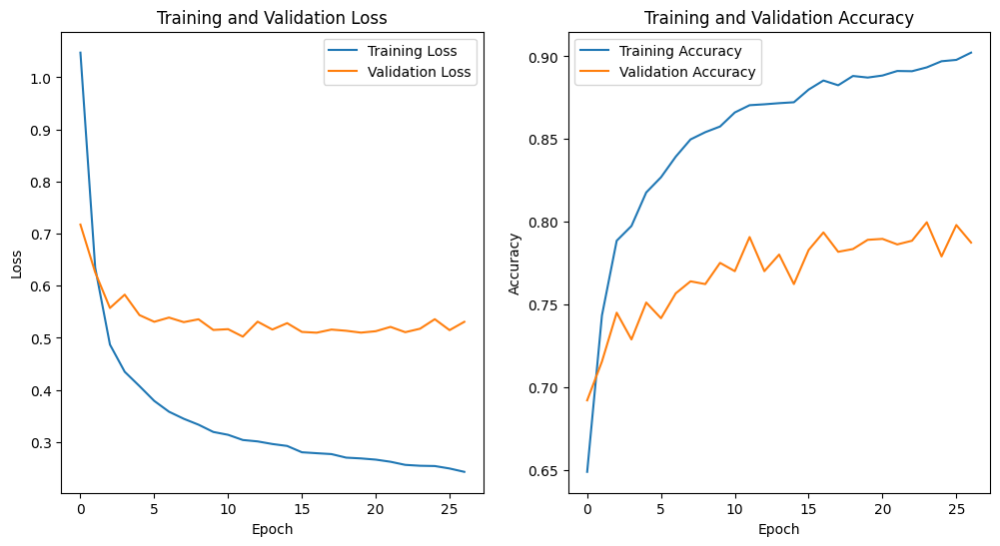

In [3]:
import matplotlib.pyplot as plt

# Plot training and validation loss
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.show()

# Inception v3

### Installing the packages

In [2]:
pip install tensorflow opencv-python
pip install mtcnn


     ---------------------------------------- 2.3/2.3 MB 12.0 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


### Importing the libraries

In [3]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dropout

## Fitting the model (using haarcascade)

In [4]:
# Parent directory path
parent_dir = r"C:\Users\dhruv\MSBA\AML\Project\0 FaceImages"

# Parameters
image_size = 299
batch_size = 32

# Haar Cascade for face detection
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

def detect_and_crop_face(image):
    # Check if the image is valid
    if image is None or len(image.shape) != 3:
        return None

    # Ensure image is in BGR format
    if image.shape[-1] == 4:  # If the image has 4 channels
        image = cv2.cvtColor(image, cv2.COLOR_BGRA2BGR)
    elif image.shape[-1] == 1:  # If the image is grayscale
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)

    # Convert image to uint8 if it's not
    if image.dtype != np.uint8:
        image = image.astype(np.uint8)

    # Convert to grayscale for face detection
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Perform face detection
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

    if len(faces) == 0:
        return None

    (x, y, w, h) = faces[0]
    face = image[y:y+h, x:x+w]
    return face

def custom_generator(directory, batch_size, subset):
    datagen = ImageDataGenerator(preprocessing_function=preprocess_input, validation_split=0.2)
    generator = datagen.flow_from_directory(
        directory,
        target_size=(image_size, image_size),
        class_mode='binary',
        batch_size=batch_size,
        shuffle=True,
        subset=subset
    )

    while True:
        batch_x, batch_y = next(generator)
        batch_faces = []
        for i in range(batch_x.shape[0]):
            face = detect_and_crop_face(batch_x[i])
            if face is not None:
                face = cv2.resize(face, (image_size, image_size))
                face = np.expand_dims(face, axis=0)
                batch_faces.append(face)
            else:
                resized = cv2.resize(batch_x[i], (image_size, image_size))
                resized = np.expand_dims(resized, axis=0)
                batch_faces.append(resized)

        if len(batch_faces) > 0:
            yield np.vstack(batch_faces), batch_y
        else:
            continue

# Load and configure the InceptionV3 model
base_model = InceptionV3(weights='imagenet', include_top=False)
for layer in base_model.layers:
    layer.trainable = False

# Add custom top layers to the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x) 
predictions = Dense(1, activation='sigmoid')(x)
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Prepare Training and Validation Data Generators
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input, validation_split=0.2)
validation_datagen = ImageDataGenerator(preprocessing_function=preprocess_input, validation_split=0.2)

train_generator = train_datagen.flow_from_directory(
    parent_dir,
    target_size=(image_size, image_size),
    class_mode='binary',
    batch_size=batch_size,
    shuffle=True,
    subset='training'
)

validation_generator = validation_datagen.flow_from_directory(
    parent_dir,
    target_size=(image_size, image_size),
    class_mode='binary',
    batch_size=batch_size,
    shuffle=True,
    subset='validation'
)

steps_per_epoch = train_generator.samples // batch_size
validation_steps = validation_generator.samples // batch_size

# Fit the model on the data
history = model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=30,
    validation_data=validation_generator,
    validation_steps=validation_steps
)

# Save the trained model
model.save('driver_drowsiness_model.h5')

# Calculate and print the accuracies
train_accuracy = history.history['accuracy'][-1]
validation_accuracy = history.history['val_accuracy'][-1]
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Validation Accuracy: {validation_accuracy:.4f}")


Found 7296 images belonging to 2 classes.
Found 1824 images belonging to 2 classes.
Epoch 1/30
228/228 [==============================] - 829s 4s/step - loss: 0.4182 - accuracy: 0.7933 - val_loss: 0.4863 - val_accuracy: 0.7319
Epoch 2/30
228/228 [==============================] - 877s 4s/step - loss: 0.3446 - accuracy: 0.8358 - val_loss: 0.5609 - val_accuracy: 0.6897
Epoch 3/30
228/228 [==============================] - 859s 4s/step - loss: 0.3127 - accuracy: 0.8610 - val_loss: 0.5149 - val_accuracy: 0.7511
Epoch 4/30
228/228 [==============================] - 849s 4s/step - loss: 0.2979 - accuracy: 0.8712 - val_loss: 0.4663 - val_accuracy: 0.7730
Epoch 5/30
228/228 [==============================] - 797s 3s/step - loss: 0.2774 - accuracy: 0.8849 - val_loss: 0.5362 - val_accuracy: 0.7527
Epoch 6/30
228/228 [==============================] - 769s 3s/step - loss: 0.2671 - accuracy: 0.8872 - val_loss: 0.4774 - val_accuracy: 0.7851
Epoch 7/30
228/228 [==============================] - 792s

## Fitting the model (using MTCNN)

In [4]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from mtcnn import MTCNN


# Parent directory path
parent_dir = r"C:\Users\dhruv\MSBA\AML\Project\0 FaceImages"

# Parameters
image_size = 299
batch_size = 32

# Initialize MTCNN face detector
mtcnn_detector = MTCNN()

def detect_and_crop_face_mtcnn(image):
    # Use MTCNN to detect faces
    faces = mtcnn_detector.detect_faces(image)
    if len(faces) == 0:
        return None, None

    # Extract the first face and its landmarks
    x, y, width, height = faces[0]['box']
    keypoints = faces[0]['keypoints']

    face = image[y:y+height, x:x+width]

    return face, keypoints

def draw_landmarks(image, keypoints):
    if keypoints:
        for point in keypoints.values():
            cv2.circle(image, point, 5, (0, 255, 0), -1)
    return image

def custom_generator(directory, batch_size, subset):
    datagen = ImageDataGenerator(
        preprocessing_function=preprocess_input,
        validation_split=0.2,
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )
    generator = datagen.flow_from_directory(
        directory,
        target_size=(image_size, image_size),
        class_mode='binary',
        batch_size=batch_size,
        shuffle=True,
        subset=subset
    )

    while True:
        batch_x, batch_y = next(generator)
        batch_faces = []
        for i in range(batch_x.shape[0]):
            face, keypoints = detect_and_crop_face_mtcnn(batch_x[i])
            if face is not None:
                face = draw_landmarks(face, keypoints)
                face = cv2.resize(face, (image_size, image_size))
                face = np.expand_dims(face, axis=0)
                batch_faces.append(face)
            else:
                resized = cv2.resize(batch_x[i], (image_size, image_size))
                resized = np.expand_dims(resized, axis=0)
                batch_faces.append(resized)

        if len(batch_faces) > 0:
            yield np.vstack(batch_faces), batch_y
            
# Load and configure the InceptionV3 model
base_model = InceptionV3(weights='imagenet', include_top=False)
for layer in base_model.layers:
    layer.trainable = False

# Add custom top layers to the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x) 
predictions = Dense(1, activation='sigmoid')(x)
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Prepare Training and Validation Data Generators
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input, validation_split=0.2)
validation_datagen = ImageDataGenerator(preprocessing_function=preprocess_input, validation_split=0.2)

train_generator = train_datagen.flow_from_directory(
    parent_dir,
    target_size=(image_size, image_size),
    class_mode='binary',
    batch_size=batch_size,
    shuffle=True,
    subset='training'
)

validation_generator = validation_datagen.flow_from_directory(
    parent_dir,
    target_size=(image_size, image_size),
    class_mode='binary',
    batch_size=batch_size,
    shuffle=True,
    subset='validation'
)

steps_per_epoch = train_generator.samples // batch_size
validation_steps = validation_generator.samples // batch_size

# Fit the model on the data
history = model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=30,
    validation_data=validation_generator,
    validation_steps=validation_steps
)

# Save the trained model
model.save('driver_drowsiness_model.h5')

# Calculate and print the accuracies
train_accuracy = history.history['accuracy'][-1]
validation_accuracy = history.history['val_accuracy'][-1]
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Validation Accuracy: {validation_accuracy:.4f}")

Found 7296 images belonging to 2 classes.
Found 1824 images belonging to 2 classes.
Epoch 1/30
228/228 [==============================] - 863s 4s/step - loss: 0.4144 - accuracy: 0.7954 - val_loss: 0.4849 - val_accuracy: 0.7357
Epoch 2/30
228/228 [==============================] - 777s 3s/step - loss: 0.3444 - accuracy: 0.8359 - val_loss: 0.4867 - val_accuracy: 0.7188
Epoch 3/30
228/228 [==============================] - 797s 3s/step - loss: 0.3127 - accuracy: 0.8616 - val_loss: 0.4884 - val_accuracy: 0.7188
Epoch 4/30
228/228 [==============================] - 756s 3s/step - loss: 0.2986 - accuracy: 0.8669 - val_loss: 0.4871 - val_accuracy: 0.7571
Epoch 5/30
228/228 [==============================] - 753s 3s/step - loss: 0.2803 - accuracy: 0.8790 - val_loss: 0.4621 - val_accuracy: 0.8032
Epoch 6/30
228/228 [==============================] - 773s 3s/step - loss: 0.2652 - accuracy: 0.8921 - val_loss: 0.4865 - val_accuracy: 0.7643
Epoch 7/30
228/228 [==============================] - 809s

In [5]:
from tensorflow.keras.models import load_model
import os
import cv2
import numpy as np

# Load the saved model
model = load_model('driver_drowsiness_model.h5')

# Directory containing test images
test_dir = r"C:\Users\dhruv\MSBA\AML\Project\0 FaceImages\Test"

# Function to preprocess and predict an image
def preprocess_and_predict(image_path, model):
    # Load and preprocess the image
    image = cv2.imread(image_path)
    face, _ = detect_and_crop_face_mtcnn(image)
    if face is not None:
        face = cv2.resize(face, (image_size, image_size))
    else:
        face = cv2.resize(image, (image_size, image_size))
    face = np.expand_dims(face, axis=0)
    face = preprocess_input(face)

    # Predict using the model
    prediction = model.predict(face)
    return prediction

# Iterate over images in the test directory
for filename in os.listdir(test_dir):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(test_dir, filename)
        prediction = preprocess_and_predict(image_path, model)
        print(f"Prediction for {filename}: {prediction}")


1/1 [==============================] - 1s 1s/step
Prediction for 1.jpeg: [[0.84563136]]
1/1 [==============================] - 0s 126ms/step
Prediction for 2.jpeg: [[0.06654401]]


In [6]:
def classify_drowsiness(prediction, threshold=0.5):
    if prediction > threshold:
        return "Drowsy"
    else:
        return "Not Drowsy"

# Iterate over images in the test directory and make predictions
for filename in os.listdir(test_dir):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(test_dir, filename)
        prediction = preprocess_and_predict(image_path, model)
        
        # Extract the probability and classify
        probability = prediction[0][0]
        classification = classify_drowsiness(probability)

        print(f"Prediction for {filename}: Probability of Drowsiness = {probability:.4f}, Classified as {classification}")


1/1 [==============================] - 0s 132ms/step
Prediction for 1.jpeg: Probability of Drowsiness = 0.8456, Classified as Drowsy
1/1 [==============================] - 0s 175ms/step
Prediction for 2.jpeg: Probability of Drowsiness = 0.0665, Classified as Not Drowsy


In [1]:
!pip install pydot graphviz


In [5]:
from tensorflow.keras.utils import plot_model

plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)



(process:11540): GLib-GIO-WARNING **: 10:55:02.203: Unexpectedly, UWP app `Microsoft.ScreenSketch_11.2309.16.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.ScreenSketch_8wekyb3d8bbwe!App') supports 29 extensions but has no verbs

(process:11540): GLib-GIO-WARNING **: 10:55:02.363: Unexpectedly, UWP app `Clipchamp.Clipchamp_2.8.3.0_neutral__yxz26nhyzhsrt' (AUMId `Clipchamp.Clipchamp_yxz26nhyzhsrt!App') supports 41 extensions but has no verbs

(process:11540): GLib-GIO-WARNING **: 10:55:02.551: Unexpectedly, UWP app `Microsoft.OutlookForWindows_1.2023.1114.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.OutlookForWindows_8wekyb3d8bbwe!Microsoft.OutlookforWindows') supports 1 extensions but has no verbs



In [6]:
from tensorflow.keras.applications.inception_v3 import InceptionV3

# Initialize a dictionary to hold the counts of each layer type
layer_counts = {}

# Iterate over each layer in the model
for layer in model.layers:
    # Get the class name of the layer (e.g., 'Conv2D', 'MaxPooling2D')
    layer_class_name = layer.__class__.__name__

    # Increment the count for this layer type
    layer_counts[layer_class_name] = layer_counts.get(layer_class_name, 0) + 1

# Print the counts of each layer type
for layer_type, count in layer_counts.items():
    print(f"{layer_type}: {count}")


InputLayer: 1
Conv2D: 94
BatchNormalization: 94
Activation: 94
MaxPooling2D: 4
AveragePooling2D: 9
Concatenate: 15
GlobalAveragePooling2D: 1
Dense: 2
Dropout: 1


## InceptionResNetV2

In [1]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dropout


# Parent directory path
parent_dir = '/Users/anubhavnehru/Desktop/UT/Advanced ML/Group Project/0 FaceImages'

# Parameters
image_size = 299
batch_size = 64

def custom_generator(directory, batch_size, subset):
    datagen = ImageDataGenerator(preprocessing_function=preprocess_input, validation_split=0.2)
    generator = datagen.flow_from_directory(
        directory,
        target_size=(image_size, image_size),
        class_mode='binary',
        batch_size=batch_size,
        shuffle=True,
        subset=subset
    )

    while True:
        batch_x, batch_y = next(generator)
        batch_faces = []
        for i in range(batch_x.shape[0]):
            face = detect_and_crop_face(batch_x[i])
            if face is not None:
                face = cv2.resize(face, (image_size, image_size))
                face = np.expand_dims(face, axis=0)
                batch_faces.append(face)
            else:
                resized = cv2.resize(batch_x[i], (image_size, image_size))
                resized = np.expand_dims(resized, axis=0)
                batch_faces.append(resized)

        if len(batch_faces) > 0:
            yield np.vstack(batch_faces), batch_y
        else:
            continue

# Load and configure the InceptionV3 model
base_model = InceptionResNetV2(weights='imagenet', include_top=False)
for layer in base_model.layers:
    layer.trainable = False

# Add custom top layers to the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x) 

predictions = Dense(1, activation='sigmoid')(x)
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Prepare Training and Validation Data Generators
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input, validation_split=0.2)
validation_datagen = ImageDataGenerator(preprocessing_function=preprocess_input, validation_split=0.2)

train_generator = train_datagen.flow_from_directory(
    parent_dir,
    target_size=(image_size, image_size),
    class_mode='binary',
    batch_size=batch_size,
    shuffle=True,
    subset='training'
)

validation_generator = validation_datagen.flow_from_directory(
    parent_dir,
    target_size=(image_size, image_size),
    class_mode='binary',
    batch_size=batch_size,
    shuffle=True,
    subset='validation'
)

Found 7296 images belonging to 2 classes.
Found 1824 images belonging to 2 classes.


In [ ]:


steps_per_epoch = train_generator.samples // batch_size
validation_steps = validation_generator.samples // batch_size

checkpoint = ModelCheckpoint("driver_drowsiness_model_InceptionResNetV2.h5", monitor='val_accuracy', verbose=1, save_best_only=True, save_weights_only=False, mode='max')


early_stopping_callbacks = tf.keras.callbacks.EarlyStopping(patience = 15,
                                                                    restore_best_weights = True,
                                                                    verbose = 1)

# Fit the model on the data
history = model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=30,
    validation_data=validation_generator,
    validation_steps=validation_steps,
    callbacks = [checkpoint,early_stopping_callbacks]
)

# Save the trained model
model.save('driver_drowsiness_model_InceptionResNetV2.h5')




In [ ]:
# Calculate and print the accuracies
train_accuracy = history.history['accuracy'][-1]
validation_accuracy = history.history['val_accuracy'][-1]
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Validation Accuracy: {validation_accuracy:.4f}")

In [ ]:
import matplotlib.pyplot as plt

# Plot training and validation loss
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.show()

In [2]:
# Load the saved weights
model.load_weights("driver_drowsiness_model_InceptionResNetV2.h5")

1/1 [==============================] - 0s 135ms/step


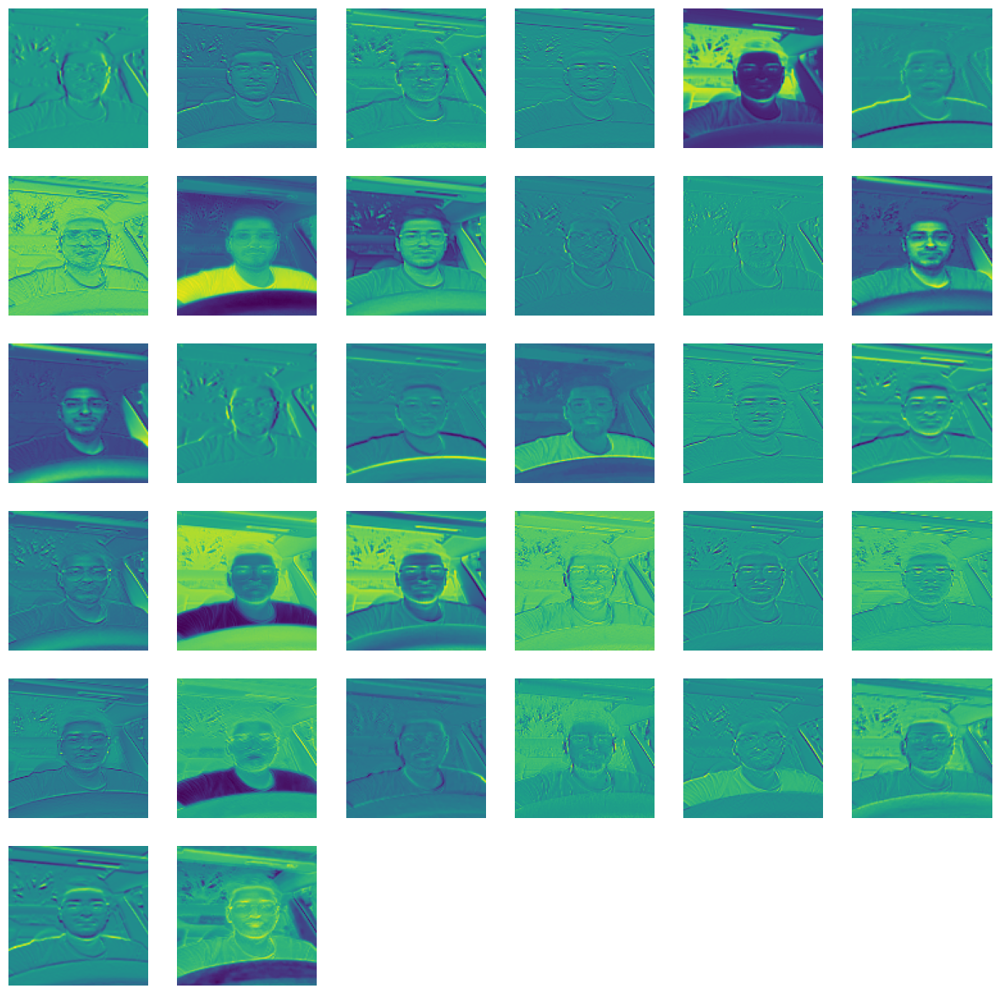

In [14]:
from tensorflow.keras.applications.vgg16 import preprocess_input
from PIL import Image
import matplotlib.pyplot as plt

# Choose a specific layer to visualize (replace 'block1_conv1' with the actual layer name)
layer_name = 'conv2d_1'
selected_layer = model.get_layer(layer_name)

# Create a new model that outputs the activations of the selected layer
activation_model = Model(inputs=model.input, outputs=selected_layer.output)

# Load an example image (replace 'path/to/your/image.jpg' with the actual path)
img_path = '/Users/anubhavnehru/Desktop/UT/Advanced ML/Group Project/driver_drowsy_v2/Sample/active/anubhav_active_2.jpeg'
img = Image.open(img_path).convert('RGB')
img = img.resize((224, 224))  # Resize the image to match the target_size
img_array = np.expand_dims(np.array(img), axis=0)
img_array = preprocess_input(img_array)  # Preprocess the image for VGG16

# Get the activations of the selected layer for the input image
activations = activation_model.predict(img_array)

def visualize_filters(activations):
    num_filters = activations.shape[-1]
    rows = int(np.sqrt(num_filters)) + 1
    cols = (num_filters // rows) + 1

    plt.figure(figsize=(15, 15))
    for i in range(num_filters):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(activations[0, :, :, i], cmap='viridis')  # You can use other colormaps
        plt.axis('off')
    plt.show()

# Visualize the filters (feature maps)
visualize_filters(activations)


In [3]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, None, None, 32)       864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, None, None, 32)       96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, None, None, 32)       0         ['batch_normalization[0][0

 conv2d_11 (Conv2D)          (None, None, None, 64)       12288     ['average_pooling2d[0][0]']   
                                                                                                  
 batch_normalization_5 (Bat  (None, None, None, 96)       288       ['conv2d_5[0][0]']            
 chNormalization)                                                                                 
                                                                                                  
 batch_normalization_7 (Bat  (None, None, None, 64)       192       ['conv2d_7[0][0]']            
 chNormalization)                                                                                 
                                                                                                  
 batch_normalization_10 (Ba  (None, None, None, 96)       288       ['conv2d_10[0][0]']           
 tchNormalization)                                                                                
          

 block35_1_conv (Conv2D)     (None, None, None, 320)      41280     ['block35_1_mixed[0][0]']     
                                                                                                  
 custom_scale_layer (Custom  (None, None, None, 320)      0         ['mixed_5b[0][0]',            
 ScaleLayer)                                                         'block35_1_conv[0][0]']      
                                                                                                  
 block35_1_ac (Activation)   (None, None, None, 320)      0         ['custom_scale_layer[0][0]']  
                                                                                                  
 conv2d_21 (Conv2D)          (None, None, None, 32)       10240     ['block35_1_ac[0][0]']        
                                                                                                  
 batch_normalization_21 (Ba  (None, None, None, 32)       96        ['conv2d_21[0][0]']           
 tchNormal

                                                                                                  
 activation_25 (Activation)  (None, None, None, 32)       0         ['batch_normalization_25[0][0]
                                                                    ']                            
                                                                                                  
 activation_28 (Activation)  (None, None, None, 48)       0         ['batch_normalization_28[0][0]
                                                                    ']                            
                                                                                                  
 conv2d_24 (Conv2D)          (None, None, None, 32)       10240     ['block35_2_ac[0][0]']        
                                                                                                  
 conv2d_26 (Conv2D)          (None, None, None, 32)       9216      ['activation_25[0][0]']       
          

                                                                                                  
 activation_32 (Activation)  (None, None, None, 32)       0         ['batch_normalization_32[0][0]
                                                                    ']                            
                                                                                                  
 activation_35 (Activation)  (None, None, None, 64)       0         ['batch_normalization_35[0][0]
                                                                    ']                            
                                                                                                  
 block35_4_mixed (Concatena  (None, None, None, 128)      0         ['activation_30[0][0]',       
 te)                                                                 'activation_32[0][0]',       
                                                                     'activation_35[0][0]']       
          

                                                                    ']                            
                                                                                                  
 conv2d_43 (Conv2D)          (None, None, None, 32)       10240     ['block35_5_ac[0][0]']        
                                                                                                  
 conv2d_46 (Conv2D)          (None, None, None, 48)       13824     ['activation_45[0][0]']       
                                                                                                  
 batch_normalization_43 (Ba  (None, None, None, 32)       96        ['conv2d_43[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_46 (Ba  (None, None, None, 48)       144       ['conv2d_46[0][0]']           
 tchNormal

 batch_normalization_48 (Ba  (None, None, None, 32)       96        ['conv2d_48[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_50 (Ba  (None, None, None, 32)       96        ['conv2d_50[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_53 (Ba  (None, None, None, 64)       192       ['conv2d_53[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_48 (Activation)  (None, None, None, 32)       0         ['batch_normalization_48[0][0]
          

 custom_scale_layer_7 (Cust  (None, None, None, 320)      0         ['block35_7_ac[0][0]',        
 omScaleLayer)                                                       'block35_8_conv[0][0]']      
                                                                                                  
 block35_8_ac (Activation)   (None, None, None, 320)      0         ['custom_scale_layer_7[0][0]']
                                                                                                  
 conv2d_63 (Conv2D)          (None, None, None, 32)       10240     ['block35_8_ac[0][0]']        
                                                                                                  
 batch_normalization_63 (Ba  (None, None, None, 32)       96        ['conv2d_63[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activatio

                                                                    ']                            
                                                                                                  
 activation_70 (Activation)  (None, None, None, 48)       0         ['batch_normalization_70[0][0]
                                                                    ']                            
                                                                                                  
 conv2d_66 (Conv2D)          (None, None, None, 32)       10240     ['block35_9_ac[0][0]']        
                                                                                                  
 conv2d_68 (Conv2D)          (None, None, None, 32)       9216      ['activation_67[0][0]']       
                                                                                                  
 conv2d_71 (Conv2D)          (None, None, None, 64)       27648     ['activation_70[0][0]']       
          

                                                                                                  
 activation_77 (Activation)  (None, None, None, 128)      0         ['batch_normalization_77[0][0]
                                                                    ']                            
                                                                                                  
 conv2d_78 (Conv2D)          (None, None, None, 160)      143360    ['activation_77[0][0]']       
                                                                                                  
 batch_normalization_78 (Ba  (None, None, None, 160)      480       ['conv2d_78[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_78 (Activation)  (None, None, None, 160)      0         ['batch_normalization_78[0][0]
          

                                                                                                  
 batch_normalization_85 (Ba  (None, None, None, 128)      384       ['conv2d_85[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_85 (Activation)  (None, None, None, 128)      0         ['batch_normalization_85[0][0]
                                                                    ']                            
                                                                                                  
 conv2d_86 (Conv2D)          (None, None, None, 160)      143360    ['activation_85[0][0]']       
                                                                                                  
 batch_normalization_86 (Ba  (None, None, None, 160)      480       ['conv2d_86[0][0]']           
 tchNormal

                                                                    ]                             
                                                                                                  
 conv2d_93 (Conv2D)          (None, None, None, 128)      139264    ['block17_4_ac[0][0]']        
                                                                                                  
 batch_normalization_93 (Ba  (None, None, None, 128)      384       ['conv2d_93[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_93 (Activation)  (None, None, None, 128)      0         ['batch_normalization_93[0][0]
                                                                    ']                            
                                                                                                  
 conv2d_94

 tomScaleLayer)                                                      'block17_6_conv[0][0]']      
                                                                                                  
 block17_6_ac (Activation)   (None, None, None, 1088)     0         ['custom_scale_layer_15[0][0]'
                                                                    ]                             
                                                                                                  
 conv2d_101 (Conv2D)         (None, None, None, 128)      139264    ['block17_6_ac[0][0]']        
                                                                                                  
 batch_normalization_101 (B  (None, None, None, 128)      384       ['conv2d_101[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activatio

 block17_8_conv (Conv2D)     (None, None, None, 1088)     418880    ['block17_8_mixed[0][0]']     
                                                                                                  
 custom_scale_layer_17 (Cus  (None, None, None, 1088)     0         ['block17_7_ac[0][0]',        
 tomScaleLayer)                                                      'block17_8_conv[0][0]']      
                                                                                                  
 block17_8_ac (Activation)   (None, None, None, 1088)     0         ['custom_scale_layer_17[0][0]'
                                                                    ]                             
                                                                                                  
 conv2d_109 (Conv2D)         (None, None, None, 128)      139264    ['block17_8_ac[0][0]']        
                                                                                                  
 batch_nor

 block17_10_mixed (Concaten  (None, None, None, 384)      0         ['activation_112[0][0]',      
 ate)                                                                'activation_115[0][0]']      
                                                                                                  
 block17_10_conv (Conv2D)    (None, None, None, 1088)     418880    ['block17_10_mixed[0][0]']    
                                                                                                  
 custom_scale_layer_19 (Cus  (None, None, None, 1088)     0         ['block17_9_ac[0][0]',        
 tomScaleLayer)                                                      'block17_10_conv[0][0]']     
                                                                                                  
 block17_10_ac (Activation)  (None, None, None, 1088)     0         ['custom_scale_layer_19[0][0]'
                                                                    ]                             
          

 activation_123 (Activation  (None, None, None, 192)      0         ['batch_normalization_123[0][0
 )                                                                  ]']                           
                                                                                                  
 block17_12_mixed (Concaten  (None, None, None, 384)      0         ['activation_120[0][0]',      
 ate)                                                                'activation_123[0][0]']      
                                                                                                  
 block17_12_conv (Conv2D)    (None, None, None, 1088)     418880    ['block17_12_mixed[0][0]']    
                                                                                                  
 custom_scale_layer_21 (Cus  (None, None, None, 1088)     0         ['block17_11_ac[0][0]',       
 tomScaleLayer)                                                      'block17_12_conv[0][0]']     
          

 activation_128 (Activation  (None, None, None, 192)      0         ['batch_normalization_128[0][0
 )                                                                  ]']                           
                                                                                                  
 activation_131 (Activation  (None, None, None, 192)      0         ['batch_normalization_131[0][0
 )                                                                  ]']                           
                                                                                                  
 block17_14_mixed (Concaten  (None, None, None, 384)      0         ['activation_128[0][0]',      
 ate)                                                                'activation_131[0][0]']      
                                                                                                  
 block17_14_conv (Conv2D)    (None, None, None, 1088)     418880    ['block17_14_mixed[0][0]']    
          

 batch_normalization_139 (B  (None, None, None, 192)      576       ['conv2d_139[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_136 (Activation  (None, None, None, 192)      0         ['batch_normalization_136[0][0
 )                                                                  ]']                           
                                                                                                  
 activation_139 (Activation  (None, None, None, 192)      0         ['batch_normalization_139[0][0
 )                                                                  ]']                           
                                                                                                  
 block17_16_mixed (Concaten  (None, None, None, 384)      0         ['activation_136[0][0]',      
 ate)     

 batch_normalization_144 (B  (None, None, None, 192)      576       ['conv2d_144[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 batch_normalization_147 (B  (None, None, None, 192)      576       ['conv2d_147[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_144 (Activation  (None, None, None, 192)      0         ['batch_normalization_144[0][0
 )                                                                  ]']                           
                                                                                                  
 activation_147 (Activation  (None, None, None, 192)      0         ['batch_normalization_147[0][0
 )        

                                                                                                  
 conv2d_155 (Conv2D)         (None, None, None, 192)      215040    ['activation_154[0][0]']      
                                                                                                  
 batch_normalization_152 (B  (None, None, None, 192)      576       ['conv2d_152[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 batch_normalization_155 (B  (None, None, None, 192)      576       ['conv2d_155[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_152 (Activation  (None, None, None, 192)      0         ['batch_normalization_152[0][0
 )        

 g2D)                                                                                             
                                                                                                  
 mixed_7a (Concatenate)      (None, None, None, 2080)     0         ['activation_157[0][0]',      
                                                                     'activation_159[0][0]',      
                                                                     'activation_162[0][0]',      
                                                                     'max_pooling2d_3[0][0]']     
                                                                                                  
 conv2d_164 (Conv2D)         (None, None, None, 192)      399360    ['mixed_7a[0][0]']            
                                                                                                  
 batch_normalization_164 (B  (None, None, None, 192)      576       ['conv2d_164[0][0]']          
 atchNorma

 e)                                                                  'activation_170[0][0]']      
                                                                                                  
 block8_2_conv (Conv2D)      (None, None, None, 2080)     933920    ['block8_2_mixed[0][0]']      
                                                                                                  
 custom_scale_layer_31 (Cus  (None, None, None, 2080)     0         ['block8_1_ac[0][0]',         
 tomScaleLayer)                                                      'block8_2_conv[0][0]']       
                                                                                                  
 block8_2_ac (Activation)    (None, None, None, 2080)     0         ['custom_scale_layer_31[0][0]'
                                                                    ]                             
                                                                                                  
 conv2d_17

 )                                                                  ]']                           
                                                                                                  
 block8_4_mixed (Concatenat  (None, None, None, 448)      0         ['activation_175[0][0]',      
 e)                                                                  'activation_178[0][0]']      
                                                                                                  
 block8_4_conv (Conv2D)      (None, None, None, 2080)     933920    ['block8_4_mixed[0][0]']      
                                                                                                  
 custom_scale_layer_33 (Cus  (None, None, None, 2080)     0         ['block8_3_ac[0][0]',         
 tomScaleLayer)                                                      'block8_4_conv[0][0]']       
                                                                                                  
 block8_4_

 )                                                                  ]']                           
                                                                                                  
 activation_186 (Activation  (None, None, None, 256)      0         ['batch_normalization_186[0][0
 )                                                                  ]']                           
                                                                                                  
 block8_6_mixed (Concatenat  (None, None, None, 448)      0         ['activation_183[0][0]',      
 e)                                                                  'activation_186[0][0]']      
                                                                                                  
 block8_6_conv (Conv2D)      (None, None, None, 2080)     933920    ['block8_6_mixed[0][0]']      
                                                                                                  
 custom_sc

 atchNormalization)                                                                               
                                                                                                  
 activation_191 (Activation  (None, None, None, 192)      0         ['batch_normalization_191[0][0
 )                                                                  ]']                           
                                                                                                  
 activation_194 (Activation  (None, None, None, 256)      0         ['batch_normalization_194[0][0
 )                                                                  ]']                           
                                                                                                  
 block8_8_mixed (Concatenat  (None, None, None, 448)      0         ['activation_191[0][0]',      
 e)                                                                  'activation_194[0][0]']      
          

 atchNormalization)                                                                               
                                                                                                  
 batch_normalization_202 (B  (None, None, None, 256)      768       ['conv2d_202[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_199 (Activation  (None, None, None, 192)      0         ['batch_normalization_199[0][0
 )                                                                  ]']                           
                                                                                                  
 activation_202 (Activation  (None, None, None, 256)      0         ['batch_normalization_202[0][0
 )                                                                  ]']                           
          

In [4]:
!pip install keras

In [5]:
!pip install pydot

In [6]:
!pip install pydot

In [7]:
!pip install graphviz

In [8]:
!pip install pydot --upgrade

In [9]:
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import plot_model


# Plot the model summary and save it to a file (e.g., 'model_plot.png')
plot_model(model, to_file='/Users/anubhavnehru/Desktop/UT/Advanced ML/Group Project/model_plot.png', show_shapes=True, show_layer_names=True)


In [10]:
from IPython.display import Image
Image("model_plot.png")

## iNNvestigate

In [2]:
import tensorflow as tf
import tensorflow.keras.applications.vgg16 as vgg16
tf.compat.v1.disable_eager_execution()

import innvestigate

# Get model
model, preprocess = vgg16.VGG16(), vgg16.preprocess_input
# Strip softmax layer
model = innvestigate.model_wo_softmax(model)

In [3]:
# Create analyzer
analyzer = innvestigate.create_analyzer("deep_taylor", model)

In [ ]:
#a = analyzer.analyze(x)

### Non Drowsy image

In [4]:
#Load non drowsy image
img_path = './driver_drowsy_v2/sample/active/image_210 (3).jpg'
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


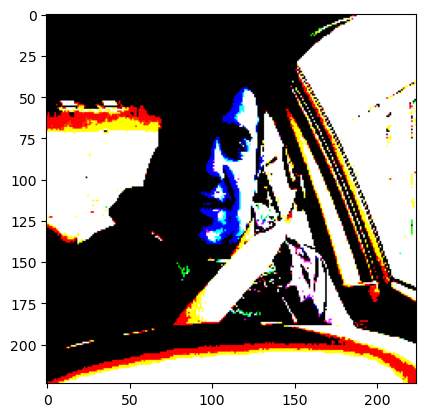

In [6]:
import matplotlib.pyplot as plt
plt.imshow(x.squeeze())

In [7]:
# Applying the analyzer
a = analyzer.analyze(x)

C:\Users\dlr93\anaconda3\Lib\site-packages\keras\src\engine\training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


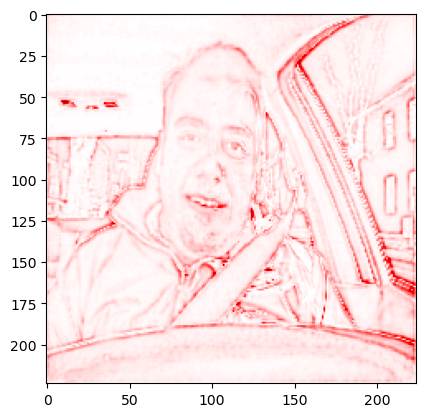

In [8]:
# Aggregate along color channels and normalize to [-1, 1]
a = a.sum(axis=np.argmax(np.asarray(a.shape) == 3))
a /= np.max(np.abs(a))
# Plot
plt.imshow(a[0], cmap="seismic", clim=(-1, 1))

### Drowsy image

In [9]:
#Load drowsy image
img_path = './driver_drowsy_v2/sample/fatigue/26.jpg'
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


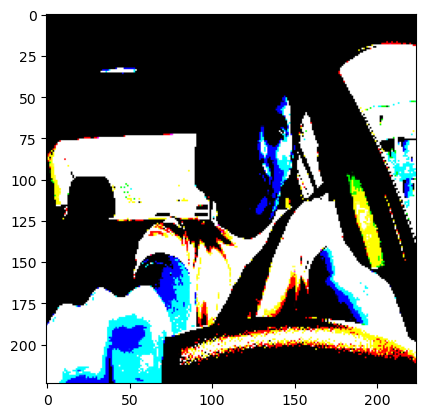

In [10]:
plt.imshow(x.squeeze())

In [11]:
# Applying the analyzer
a = analyzer.analyze(x)

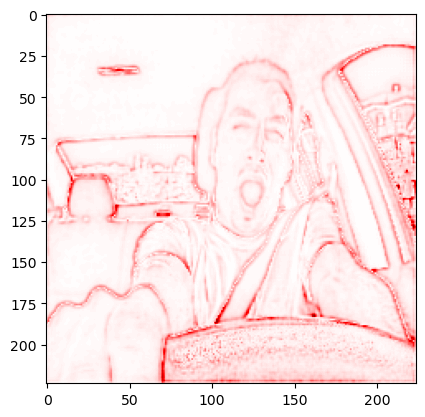

In [12]:
# Aggregate along color channels and normalize to [-1, 1]
a = a.sum(axis=np.argmax(np.asarray(a.shape) == 3))
a /= np.max(np.abs(a))
# Plot
plt.imshow(a[0], cmap="seismic", clim=(-1, 1))